In [ ]:
# Unzip files
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# End-to-end Multiclass Dog Breed Classification

This notebook builds an end-to-end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog.

## 2. Data

The data we'are using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* We'are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are around 10000+ images in the training set(these images have labels)
* There are around 10000+ images in the test set (these images have no labels, because we'll want to predict them).

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (yess!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.15.0
Hub version: 0.15.0
GPU available (yess!!!)


## Getting our data ready (turning into tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors(numerical representations)

Let's start by accessing our data and checking out labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

labels_csv.describe(), labels_csv.head()

(                                      id               breed
 count                              10222               10222
 unique                             10222                 120
 top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
 freq                                   1                 126,
                                  id             breed
 0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
 1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
 2  001cdf01b096e06d78e9e5112d419397          pekinese
 3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
 4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever)

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


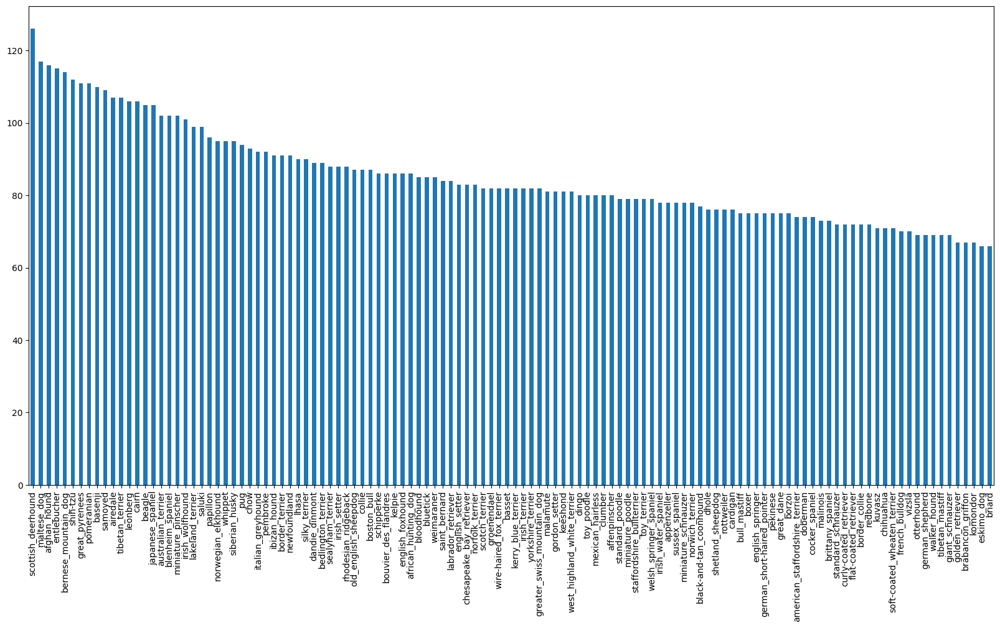

In [ ]:
# How many images are there of each breed
labels_csv.breed.value_counts().plot.bar(figsize=(20, 10));

In [ ]:
labels_csv.breed.value_counts().mean(), labels_csv.breed.value_counts().std()

(85.18333333333334, 13.298122274306587)

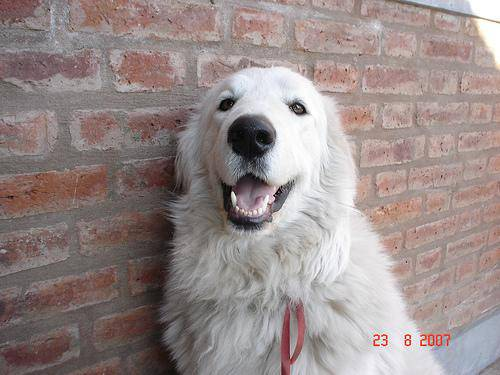

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/0a0c223352985ec154fd604d7ddceabd.jpg")

### Getting images and their label

Let's get a list of all of our image file pathnames.

In [ ]:
# Create pathnames from image ID's
filenames = []
for id in labels_csv['id']:
  filenames.append("drive/MyDrive/Dog Vision/train/" + id + ".jpg")

# Check the first 10

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


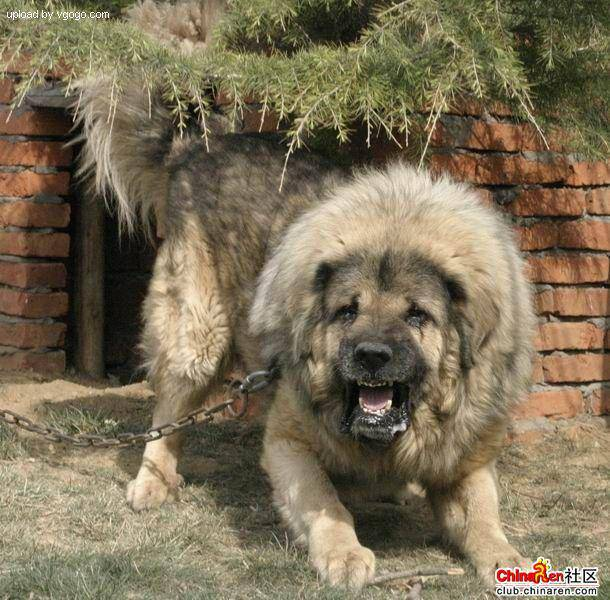

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've ow got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()

# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames
type(labels_csv)
labels_csv.isna().sum()
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values

unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)


(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Turn a single label into an array of booleans

# for breed in unique_breeds:
# test = [labels[0] == unique_breeds]
test = []
for breed in unique_breeds:
  test.append(labels[0] == breed)
test

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we'are going to create our own.

In [ ]:
# Set up X & y variabler
X = filenames
y= boolean_labels

We are going to start off experimenting with 1000 images and increases as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets

from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a look at the training data
X_train[:5], y_train[:5]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn pur `image` (a jpg) into tensors
4. Resize the `image` to be shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?
Let's say you're trying to process 10000+ images in one go they all might not fit into memory.  
So that's why we do about 32 (this is the batch size) images at a time (You can manually adjust the batch  
In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:

In [ ]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)

  return (image, label)



In [ ]:
get_image_label(X[42], y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensorrs in the form : ``(image, label) let's make a function to turn all of our data (X&y) into batches!

In [ ]:
# Define the batch size, 32 is a good start off
BATCH_SIZE = 32

# Create a function to turn into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    #Shuffling pathnames and labels before creating batches
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize it.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 for displaying 25 images
  for i in range(25):
    # Create subplots (5rows, 5 columns)
    ax =plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

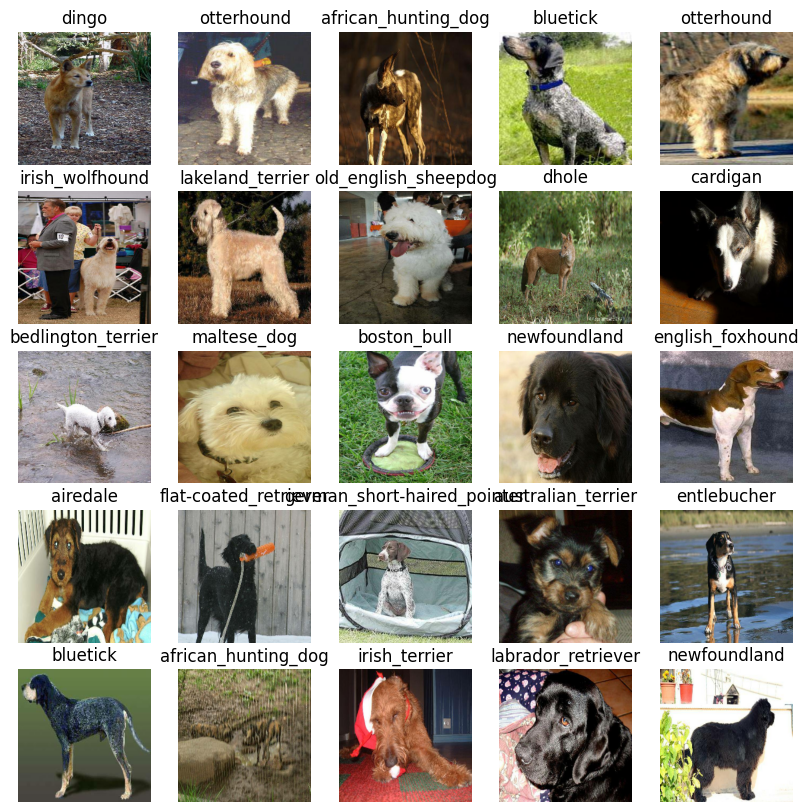

In [ ]:
# Now let's visualize the data in a training batch

show_25_images(train_images, train_labels)

In [ ]:
# Now let's visualize our validation set

val_images, val_labels = next(val_data.as_numpy_iterator())

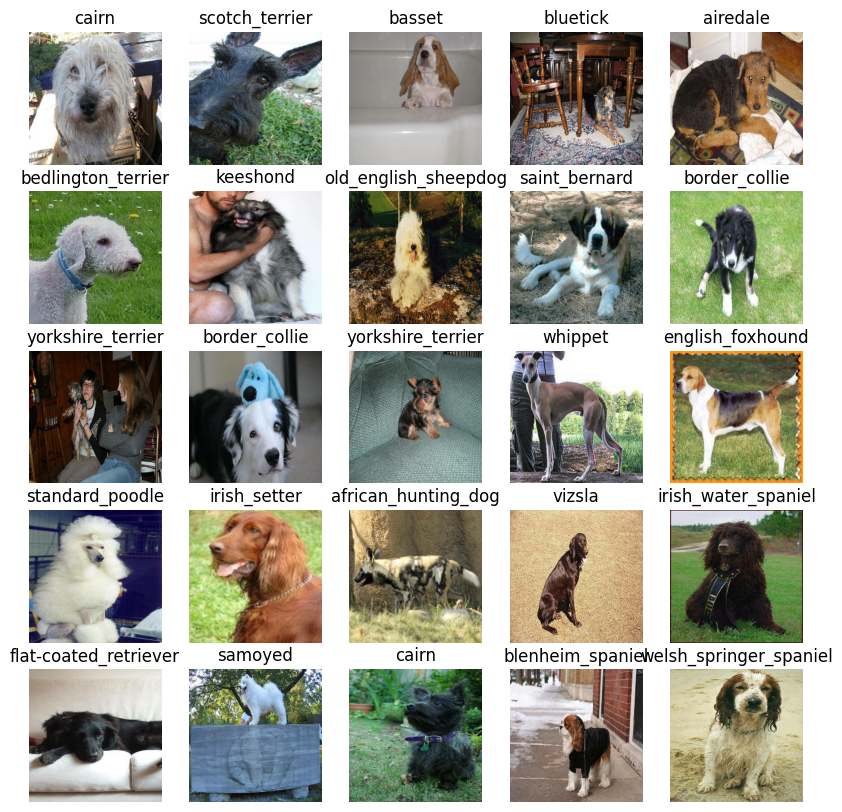

In [ ]:
show_25_images(val_images, val_labels)

## Building a model

Before we build a model there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) of our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour cahnnels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TENSORFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!  
Knowing this, let's create a function which:  
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

All of the steps can be found here:

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()


Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To set up a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension
2. Create a Tensorboard callback which is able to save loggs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback

def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard ogs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model fro overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                 patience=3)

# Training a model (on subset of the data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider", min:10, max:100}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available " if tf.config.list_physical_devices("GPU") else "not available")

GPU available 


Let's create a function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` funtion on our model passing it the training data, number of epochs to train for callbacks we'd like to use.
* Return the model


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping]
            )
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 166s 6s/step - loss: 4.4585 - accuracy: 0.1163 - val_loss: 3.3286 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 6s 242ms/step - loss: 1.6065 - accuracy: 0.6750 - val_loss: 2.0945 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 2s 97ms/step - loss: 0.5588 - accuracy: 0.9413 - val_loss: 1.6432 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 2s 98ms/step - loss: 0.2463 - accuracy: 0.9887 - val_loss: 1.4768 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 4s 143ms/step - loss: 0.1438 - accuracy: 0.9987 - val_loss: 1.3902 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 3s 138ms/step - loss: 0.0983 - accuracy: 1.0000 - val_loss: 1.3494 - val_accuracy: 0.6850
Epoch 7/10

**Question:** It looks like our model is overfitting because it is performing far better on the training data set than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

## Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 124ms/step


array([[4.7626445e-04, 2.1830299e-04, 2.4444298e-04, ..., 6.2292343e-04,
        4.4281478e-06, 1.7904164e-03],
       [1.9452999e-04, 6.5728708e-04, 1.0737780e-02, ..., 3.1694188e-04,
        7.1409682e-04, 3.8636230e-05],
       [1.6505295e-06, 3.8570711e-06, 8.0166174e-06, ..., 3.6867194e-05,
        9.3040649e-07, 3.4393150e-05],
       ...,
       [2.0768755e-05, 2.5647125e-04, 1.1634982e-05, ..., 4.3915843e-06,
        1.2553300e-04, 6.0989169e-05],
       [1.0537890e-02, 4.9761235e-04, 1.8713275e-04, ..., 6.0854702e-05,
        2.1687470e-04, 1.1007254e-02],
       [3.2153007e-04, 2.0822374e-05, 1.3056375e-03, ..., 5.9538538e-04,
        4.6575634e-04, 6.5188178e-06]], dtype=float32)

In [ ]:
predictions[0]

array([4.76264453e-04, 2.18302986e-04, 2.44442985e-04, 4.74750523e-05,
       9.75651419e-05, 4.19620847e-05, 5.83886057e-02, 1.64803074e-04,
       1.01672148e-03, 6.45672088e-04, 3.76334268e-04, 1.22178200e-04,
       3.60880746e-04, 4.70389787e-05, 2.24041985e-04, 1.05620362e-03,
       2.76277482e-04, 1.95862547e-01, 2.40577629e-05, 5.30694342e-05,
       2.82994763e-04, 2.78174703e-04, 3.97858494e-05, 1.90513954e-03,
       3.48691319e-05, 3.61902785e-05, 3.10038805e-01, 1.30632296e-04,
       4.85185534e-04, 1.11340516e-04, 1.73406224e-05, 1.44566118e-03,
       1.19870376e-04, 1.28881520e-05, 8.50248252e-05, 1.37126502e-02,
       1.31920860e-05, 2.18375659e-04, 1.19040742e-04, 8.61879380e-05,
       4.41297394e-04, 6.76932177e-06, 6.95180424e-05, 1.42044937e-05,
       1.84703003e-05, 2.04119046e-04, 3.37583442e-05, 6.19900471e-04,
       4.27655817e-04, 9.27032379e-05, 1.42127261e-04, 1.55023896e-04,
       3.54144606e-04, 1.39536132e-04, 4.44107282e-04, 3.43307947e-05,
      

In [ ]:
sum(predictions[0]), len(predictions[0]), predictions.shape

(1.000000081984581, 120, (200, 120))

In [ ]:
# First prediction
index=0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")

[4.76264453e-04 2.18302986e-04 2.44442985e-04 4.74750523e-05
 9.75651419e-05 4.19620847e-05 5.83886057e-02 1.64803074e-04
 1.01672148e-03 6.45672088e-04 3.76334268e-04 1.22178200e-04
 3.60880746e-04 4.70389787e-05 2.24041985e-04 1.05620362e-03
 2.76277482e-04 1.95862547e-01 2.40577629e-05 5.30694342e-05
 2.82994763e-04 2.78174703e-04 3.97858494e-05 1.90513954e-03
 3.48691319e-05 3.61902785e-05 3.10038805e-01 1.30632296e-04
 4.85185534e-04 1.11340516e-04 1.73406224e-05 1.44566118e-03
 1.19870376e-04 1.28881520e-05 8.50248252e-05 1.37126502e-02
 1.31920860e-05 2.18375659e-04 1.19040742e-04 8.61879380e-05
 4.41297394e-04 6.76932177e-06 6.95180424e-05 1.42044937e-05
 1.84703003e-05 2.04119046e-04 3.37583442e-05 6.19900471e-04
 4.27655817e-04 9.27032379e-05 1.42127261e-04 1.55023896e-04
 3.54144606e-04 1.39536132e-04 4.44107282e-04 3.43307947e-05
 5.97706297e-04 3.29422322e-03 6.26166468e-04 1.15187719e-01
 3.32063471e-04 8.46269686e-05 7.56593246e-04 1.31149965e-04
 5.41677728e-05 2.279615

Having the above functionality is great but we want to be able to do it at scale.  
And it would be even better if we could see the image the prediction is being made on!  
**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  print(f"dunction returns: {np.argmax(prediction_probabilities)} ")
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of predition probabilities
pred_label = get_pred_label(predictions[9])
pred_label

dunction returns: 33 


'collie'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of image and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

dunction returns: 26 


'cairn'

In [ ]:
get_pred_label(predictions[0])

dunction returns: 26 


'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit mode visualize

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the color of the title depending on the whether or not prediction is wright
  if pred_label == true_label:
    color='green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

dunction returns: 54 


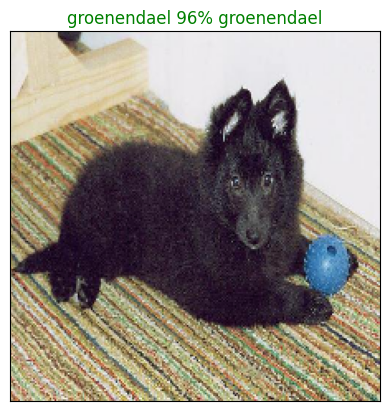

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)


In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label gree.

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0].shape

(120,)

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 26,  17,  59,   6,  70, 103, 106,  73,  65,  77])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.3100388 , 0.19586255, 0.11518772, 0.05838861, 0.05714434,
       0.04710998, 0.03206897, 0.02800564, 0.02279616, 0.01953165],
      dtype=float32)

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['cairn', 'border_terrier', 'irish_wolfhound', 'australian_terrier',
       'lhasa', 'soft-coated_wheaten_terrier', 'standard_schnauzer',
       'maltese_dog', 'komondor', 'miniature_schnauzer'], dtype=object)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth label fo sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get pred label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

dunction returns: 33 


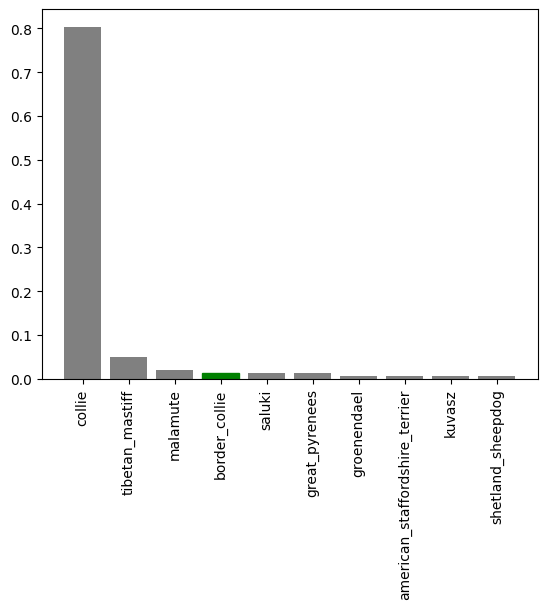

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our models, let's check out.

dunction returns: 70 
dunction returns: 70 
dunction returns: 92 
dunction returns: 92 
dunction returns: 6 
dunction returns: 6 
dunction returns: 117 
dunction returns: 117 
dunction returns: 39 
dunction returns: 39 
dunction returns: 76 
dunction returns: 76 


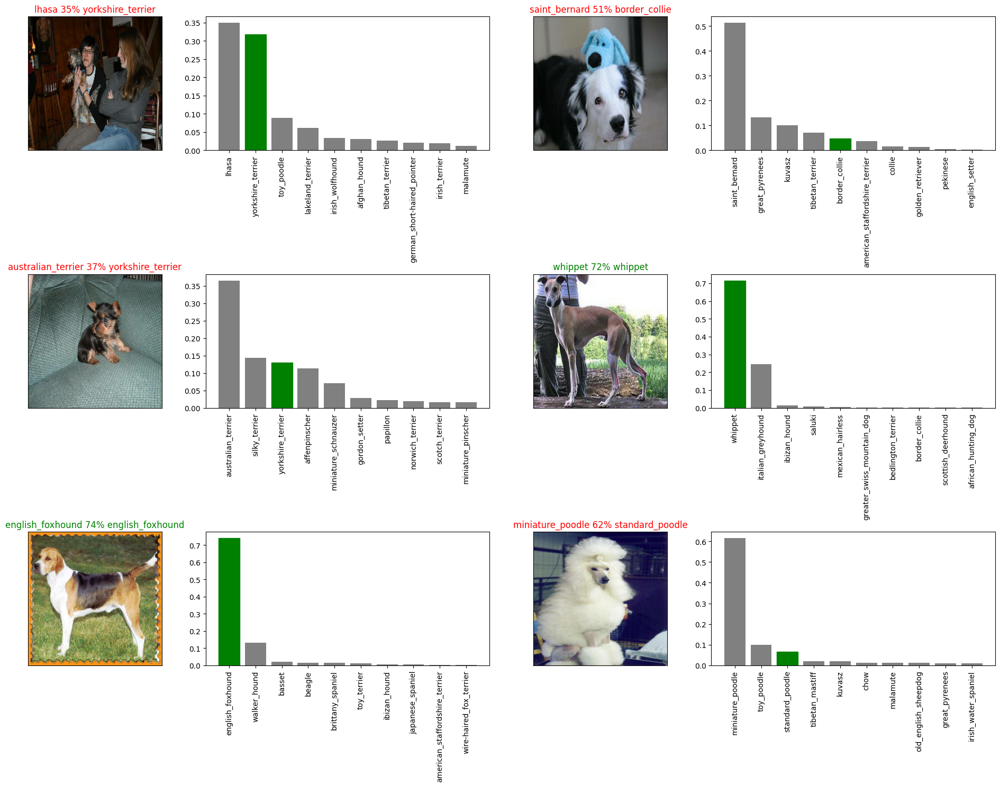

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1)

plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """

  #Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s")
                          )
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")


Saving model to: drive/My Drive/Dog vision/models/20240103-15151704294946-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog vision/models/20240103-15151704294946-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog vision/models/20240102-17131704215606-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog vision/models/20240102-17131704215606-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 71ms/step - loss: 1.2536 - accuracy: 0.6850


[1.25359308719635, 0.6850000023841858]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 68ms/step - loss: 1.3322 - accuracy: 0.6550


[1.3322409391403198, 0.6549999713897705]

## Training a big dog model (on the full data)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model fo full model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [ ]:
# Create full model Callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)


**Note:** Running the cell below will take a little while because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 34s 91ms/step - loss: 1.3183 - accuracy: 0.6727
Epoch 2/100
320/320 [==============================] - 27s 84ms/step - loss: 0.4021 - accuracy: 0.8825
Epoch 3/100
320/320 [==============================] - 28s 87ms/step - loss: 0.2381 - accuracy: 0.9357
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1521 - accuracy: 0.9663
Epoch 5/100
320/320 [==============================] - 31s 97ms/step - loss: 0.1080 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 28s 88ms/step - loss: 0.0749 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 28s 88ms/step - loss: 0.0589 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0466 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 27s 84ms/step - loss: 0.0369 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 28s 89ms/step - 

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog vision/models/20240103-15371704296255-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog vision/models/20240103-15371704296255-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Loading the full model
loaded_full_model = load_model('drive/My Drive/Dog vision/models/20240103-15371704296255-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog vision/models/20240103-15371704296255-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take alist of filenames as input and cover them into Tensor batches. To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_date_batches()` and setting the `test_data` parameter to `True` (since the test data doen't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/d9b6a3661bab4709275a1f6fa0160f90.jpg',
 'drive/My Drive/Dog Vision/test/d9b0c0bc4de8b19e3452fc477ebdf5a6.jpg',
 'drive/My Drive/Dog Vision/test/d9b9a2e622cc9cec857b627cbea801a5.jpg',
 'drive/My Drive/Dog Vision/test/d9b9bc0839bc75beb0686e21c143c0eb.jpg',
 'drive/My Drive/Dog Vision/test/d9cbed1442cca5be2780092bbfbfaf15.jpg',
 'drive/My Drive/Dog Vision/test/d9c15495c3e80aa149f598cebccfc37c.jpg',
 'drive/My Drive/Dog Vision/test/d9cc62cf60266f824731f8a4e70ba718.jpg',
 'drive/My Drive/Dog Vision/test/d9d7483ff16378df33da92a79af52bf1.jpg',
 'drive/My Drive/Dog Vision/test/d9d9c99f2c03d23f178441f8713798b6.jpg',
 'drive/My Drive/Dog Vision/test/d9da5d7cce5cd4c6aea98f12c2338eb9.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data baches
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take along time ago.(about 1 hour)

In [ ]:
test_predictions=loaded_1000_image_model.predict(test_data,
                                         verbose=1)

324/324 [==============================] - 212s 631ms/step


In [ ]:
 # Save predictions (NumpyArray) to csv file for accessing later
 np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=',')

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=',')

In [ ]:
test_predictions[:10]

array([[3.17112310e-04, 9.06860369e-05, 1.16577408e-04, ...,
        3.92006987e-05, 7.26715429e-04, 4.88978752e-04],
       [5.12255319e-05, 2.08807724e-05, 1.14230046e-04, ...,
        4.29842003e-05, 1.41709606e-04, 1.06984715e-03],
       [3.77496183e-01, 1.98767590e-03, 1.15458469e-03, ...,
        1.03964424e-03, 1.99911534e-04, 1.92949437e-02],
       ...,
       [2.06735331e-05, 1.14992428e-04, 3.09574389e-05, ...,
        3.17055703e-04, 1.95094990e-03, 3.15887664e-05],
       [3.31442311e-06, 1.95789344e-05, 3.62970051e-04, ...,
        1.69959691e-04, 1.84915436e-04, 1.38390997e-05],
       [6.87189633e-04, 7.31440377e-05, 6.28618523e-04, ...,
        3.86285428e-05, 1.09256849e-04, 1.39701320e-03]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities ) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to KAggle

In [ ]:
preds_df = pd.DataFrame(columns=(['id']+ list(unique_breeds)))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
# Add prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,d9b6a3661bab4709275a1f6fa0160f90,0.000317,0.000091,0.000117,0.000005,0.011239,0.000068,0.000229,0.001905,0.000267,...,0.006659,0.000254,0.000142,0.002418,0.000025,0.000040,0.675610,0.000039,0.000727,0.000489
1,d9b0c0bc4de8b19e3452fc477ebdf5a6,0.000051,0.000021,0.000114,0.000320,0.000080,0.000010,0.000131,0.000207,0.000067,...,0.000035,0.000935,0.000026,0.000037,0.000024,0.000038,0.000085,0.000043,0.000142,0.001070
2,d9b9a2e622cc9cec857b627cbea801a5,0.377496,0.001988,0.001155,0.000283,0.000177,0.000079,0.005912,0.004704,0.000253,...,0.000524,0.000157,0.000062,0.000652,0.000043,0.000127,0.042839,0.001040,0.000200,0.019295
3,d9b9bc0839bc75beb0686e21c143c0eb,0.103374,0.003717,0.001274,0.000007,0.000287,0.000006,0.013524,0.006529,0.000075,...,0.000053,0.000726,0.000007,0.000514,0.000032,0.000181,0.017317,0.000079,0.000011,0.002689
4,d9cbed1442cca5be2780092bbfbfaf15,0.001608,0.004700,0.000951,0.000369,0.001529,0.002255,0.000082,0.000649,0.000238,...,0.004523,0.000793,0.002419,0.000799,0.000620,0.001728,0.000983,0.001012,0.000334,0.000072


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv', index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have a labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions label.
* Compare the predicted labels to the custom images

In [ ]:
# Get custom image filepaths

custom_path = 'drive/My Drive/Dog Vision/my-dog-photos/'
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths.pop()

'drive/My Drive/Dog Vision/my-dog-photos/.ipynb_checkpoints'

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/Kangal_1.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/Kangal_2.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
# Get custom iamge prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

dunction returns: 101 
dunction returns: 28 


['siberian_husky', 'chesapeake_bay_retriever']

In [ ]:
#
custom_images=[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


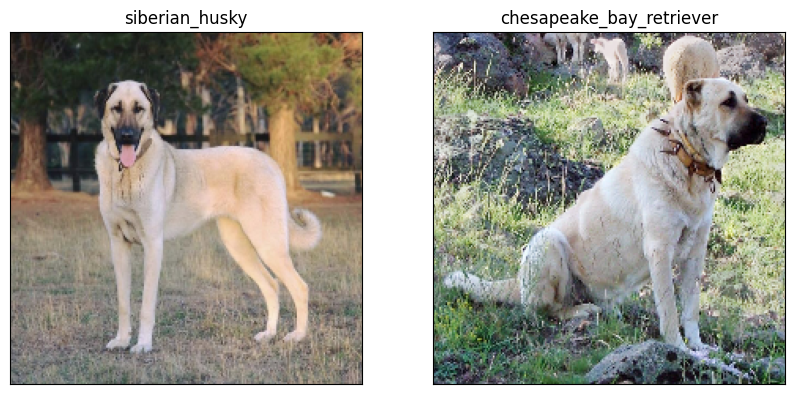

In [ ]:
# Check suctom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 2, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)